# Analytics - reference-only analysis

In [2]:
import scvi
from scvi.criticism import PosteriorPredictiveCheck as PPC
from ppc_plot_utils import PPCPlot
import anndata
import pandas as pd
import scanpy as sc
import gc
import matplotlib.pyplot as plt
import mplscience
from pathlib import Path
from scvi.data._download import _download
from scvi.data import cellxgene
import os
from scvi.model.base import ArchesMixin
import warnings
from sparse import SparseArray
from typing import Optional
from scipy.sparse import csr_matrix
import numpy as np

scvi.settings.seed = 0

# plotting commands for the styling
# sns.reset_orig()
mplscience.set_style(reset_current=True, name="default")

%load_ext autoreload
%autoreload 2

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 0


## 1️⃣ Load the model and raw data

Here we use the HLCA dataset.

Sikkema, L., Ramírez-Suástegui, C., Strobl, D.C. et al. An integrated cell atlas of the lung in health and disease. Nat Med 29, 1563–1577 (2023). https://doi.org/10.1038/s41591-023-02327-2

Let's download the pre-trained model

In [3]:
local_dir = "/home/cane/Documents/yoseflab/can/scvi-hub"

In [4]:
model_url = "https://huggingface.co/scvi-tools/human-lung-cell-atlas/resolve/main/model.pt"
_download(model_url, local_dir, "model.pt")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


Download the raw counts:

In [5]:
adata_url = "https://cellxgene.cziscience.com/e/066943a2-fdac-4b29-b348-40cede398e4e.cxg/"
b = scvi.data.cellxgene(adata_url, filename="hlca_core.h5ad", save_path=local_dir)

In [6]:
def get_hlca_core_adata_cellxgene():
    adata_url = "https://cellxgene.cziscience.com/e/066943a2-fdac-4b29-b348-40cede398e4e.cxg/"
    # takes ~2min to load if data already downloaded
    adata = cellxgene(adata_url, filename="hlca_core.h5ad", save_path=local_dir)

    # get unnormalized, raw counts
    adata.X = adata.raw.X
    gc.collect()

    # filter to highly variable genes
    _, mvars, _, _ = scvi.model.base._utils._load_saved_files(local_dir, load_adata=False)
    adata = adata[:, adata.var.index.isin(mvars)].copy()

    # get rid of some var columns that we dont need -- will make later processing easier
    del adata.var["feature_is_filtered"]
    del adata.var["feature_reference"]
    del adata.var["feature_biotype"]

    # 4 genes are missing from cellxgene that are in the model. prepare_query_anndata will pad them with zeros.
    ArchesMixin.prepare_query_anndata(adata, local_dir)

    # add feature_names for the padded genes
    gene_ids = ['ENSG00000253701', 'ENSG00000269936', 'ENSG00000274961', 'ENSG00000279576']
    feature_names = ['AL928768.3', 'RP11-394O4.5', 'RP3-492J12.2', 'AP000769.1']
    adata.var["feature_name"] = adata.var["feature_name"].cat.add_categories(feature_names)
    for g,f in zip(gene_ids, feature_names):
        adata.var.loc[g, "feature_name"] = f

    return adata

# To print the 4 missing genes from adata run this 👇
# bdata = anndata.read_h5ad(os.path.join(local_dir, "adata.h5ad"), backed=True) # downloaded from cellxgene
# _, mvars, _, _ = scvi.model.base._utils._load_saved_files(local_dir, load_adata=False)
# a = list(mvars)
# b = list(adata.var[adata.var.index.isin(mvars)].index)
# diffs = [e for e in a if e not in b]
# print(diffs)

In [7]:
adata = get_hlca_core_adata_cellxgene()

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               
INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               
INFO     Found 99.8% reference vars in query data.                                                                 


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


Finally, load the model.

In [8]:
model = scvi.model.SCANVI.load(local_dir, adata = adata, accelerator="gpu")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scvi/data/fields/_dataframe_field.py:227: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scvi/data/fields/_scanvi.py:58: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Model

## 2️⃣ Goodness of fit with PPC + CV

In [8]:
# run ppc+cv
# expected runtime ~5min
models_dict = {"SCANVI": model}
ppc = PPC(model.adata, models_dict, n_samples=2)

In [9]:
# expected runtime ~8min
ppc.coefficient_of_variation("features")

In [10]:
ppc

--- Posterior Predictive Checks ---
n_samples = 2
raw_counts shape = (584944, 2000)
models: ['SCANVI']
metrics: 
{
    "cv_cell": "Pandas DataFrame with shape=(584944, 2), columns=['SCANVI', 'Raw']"
}

In [11]:
temp_fig_dir = "/home/cane/Documents/yoseflab/can/scvi-hub/scvi-hub-reproducibility/figures/"

model=SCANVI | metric=cv_cell | n_cells=584944:
Mean Absolute Error=1.56,
Pearson correlation=0.92
Spearman correlation=0.83
r^2=0.84



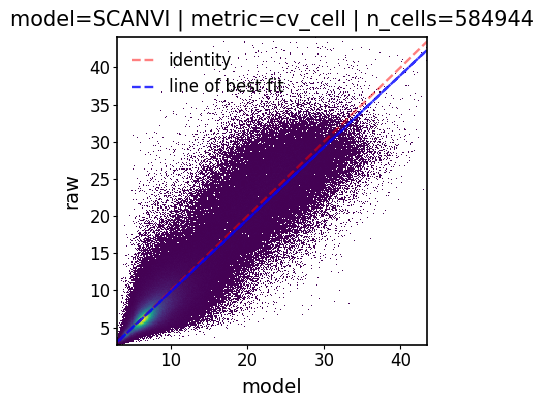

In [12]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="hist2d")

fig_path = f'{temp_fig_dir}/ppc_cv_cell.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

In [13]:
ppc.metrics['cv_cell'].median()

SCANVI    7.446930
Raw       7.097055
dtype: float32

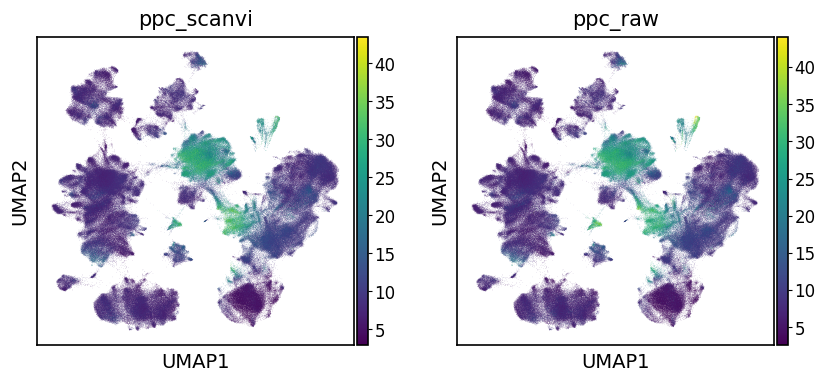

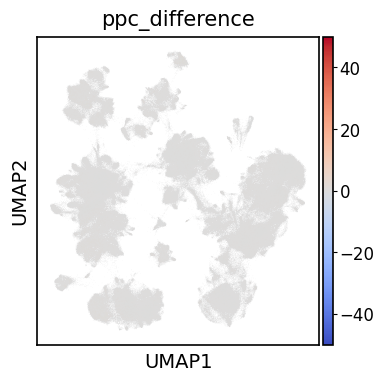

In [14]:
adata.obs['ppc_scanvi'] = ppc.metrics['cv_cell']['SCANVI']
adata.obs['ppc_raw'] = ppc.metrics['cv_cell']['Raw']
adata.obs['ppc_difference'] = (adata.obs['ppc_scanvi'] - adata.obs['ppc_raw']) / adata.obs['ppc_raw']
sc.pl.umap(adata, color=['ppc_scanvi', 'ppc_raw'])
sc.pl.umap(adata, color=['ppc_difference'], color_map='coolwarm', vmax=50, vmin=-50)

In [28]:
np.max(adata.obs['ppc_scanvi'] / adata.obs['ppc_raw'])

4.239629

In [ ]:
adata.obs['ppc_difference'] = np.log(adata.obs['ppc_scanvi'] / adata.obs['ppc_raw'])
sc.pl.umap(adata, color=['ppc_difference', 'cell_type', 'scanvi_label'], color_map='seismic', vmax=1.0, vmin=-1.0, ncols=1, legend_fontsize=7, sort_order=False, save='ppc_cells.svg')

In [16]:
# expected runtime ~8min
ppc.coefficient_of_variation("cells")

In [17]:
ppc.metrics['cv_gene'] = np.log(ppc.metrics['cv_gene'])

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


In [18]:
ppc.metrics['cv_gene'][ppc.metrics['cv_gene'] < 0] = 0

model=SCANVI | metric=cv_gene | n_cells=584944:
Mean Absolute Error=0.13,
Pearson correlation=0.97
Spearman correlation=0.98
r^2=0.94



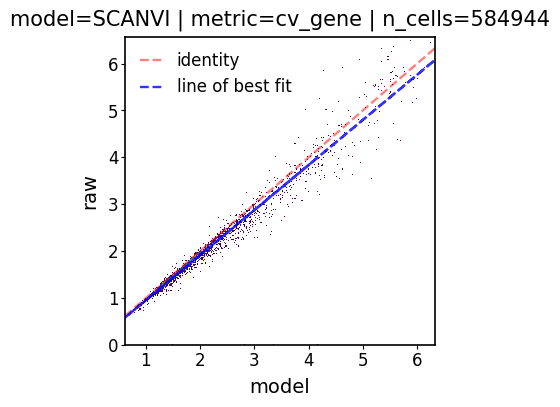

In [19]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_cv(model_name="SCANVI", cell_wise=False, plt_type="hist2d")

fig_path = f'{temp_fig_dir}/ppc_cv_gene.svg'
plt.savefig(fig_path, dpi=600, bbox_inches="tight")

model=SCANVI | metric=cv_cell | n_cells=584944:
Mean Absolute Error=1.56,
Pearson correlation=0.92
Spearman correlation=0.83
r^2=0.84



/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


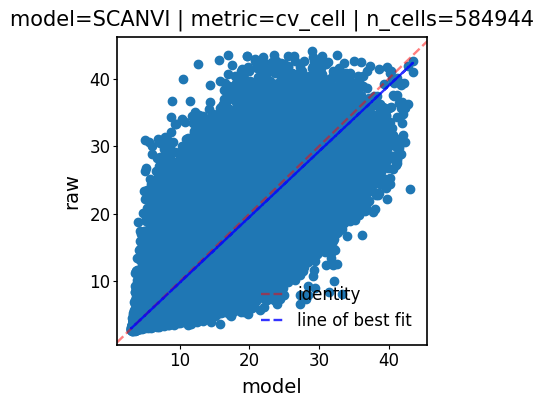

In [20]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_cv(model_name="SCANVI", cell_wise=True, plt_type="scatter")

## 3️⃣ Goodness of fit with PPC + DE

In [8]:
# run ppc+DE
models_dict = {"SCANVI": model}
ppc = PPC(model.adata, models_dict, n_samples=20)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


In [35]:
# expected runtime <1min
ppc.differential_expression(de_groupby="ann_level_3", p_val_thresh=0.2)

In [36]:
ppc.metrics["diff_exp"]["summary"]

,gene_overlap_f1,lfc_mae,lfc_pearson,lfc_spearman,roc_auc,pr_auc,group,model
0,0.96,1.252667,0.673183,0.882827,0.162301,0.9531,AT1,SCANVI
1,0.97,0.271882,0.902502,0.978719,0.17526,0.989244,AT2,SCANVI
2,0.95,0.79072,0.763508,0.931908,0.238895,0.957648,B cell lineage,SCANVI
3,0.98,0.249239,0.937037,0.993082,0.300719,0.98499,Basal,SCANVI
4,0.92,0.545563,0.771461,0.966467,0.339232,0.95753,Dendritic cells,SCANVI
5,0.96,1.197084,0.71593,0.931989,0.277,0.967032,EC arterial,SCANVI
6,0.98,0.634074,0.84523,0.965342,0.259146,0.985132,EC capillary,SCANVI
7,0.95,0.680383,0.793643,0.953001,0.255449,0.964584,EC venous,SCANVI
8,0.93,0.417005,0.890982,0.980246,0.292585,0.973317,Fibroblasts,SCANVI
9,0.96,0.623895,0.826804,0.966016,0.267463,0.975099,Innate lymphoid cell NK,SCANVI


Plot the summary results

/home/cane/Documents/yoseflab/can/scvi-hub/scvi-hub-reproducibility/ppc_plot_utils.py:194: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.stripplot(model_de_metrics, size=4, color=".3", linewidth=1, palette=sns.color_palette("pastel"))


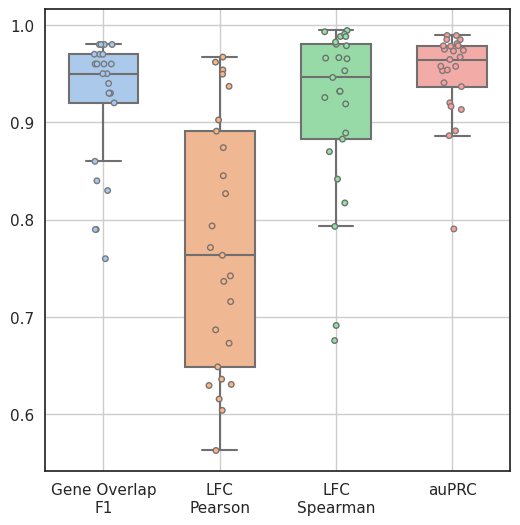

In [37]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_diff_exp(
    "SCANVI",
    plot_kind="summary_box_with_obs",
)
fig_path = f'{temp_fig_dir}/de_summary_violin.svg'
plt.savefig(fig_path, dpi=300, bbox_inches="tight")
plt.show()

Plot per-group LFC scatterplots.

[names
 ENSG00000107796    False
 ENSG00000149591    False
 ENSG00000198467    False
 ENSG00000101335    False
 ENSG00000163017    False
                    ...  
 ENSG00000182853     True
 ENSG00000189143     True
 ENSG00000121858     True
 ENSG00000163435    False
 ENSG00000121552     True
 Length: 2000, dtype: bool]

Index(['ENSG00000211673', 'ENSG00000169347', 'ENSG00000167419',
       'ENSG00000184908', 'ENSG00000244575', 'ENSG00000169035',
       'ENSG00000278196', 'ENSG00000211659', 'ENSG00000183813',
       'ENSG00000243290',
       ...
       'ENSG00000086300', 'ENSG00000103534', 'ENSG00000141934',
       'ENSG00000185215', 'ENSG00000242574', 'ENSG00000119888',
       'ENSG00000182853', 'ENSG00000189143', 'ENSG00000121858',
       'ENSG00000121552'],
      dtype='object', name='names', length=429)

In [58]:
bd = model.adata[
    model.adata.obs["ann_level_3"]=='Smooth muscle FAM83D+', ppc.metrics['diff_exp']['lfc_per_model_per_group']['SCANVI']['Smooth muscle FAM83D+'][
        np.abs(ppc.metrics['diff_exp']['lfc_per_model_per_group']['SCANVI']['Smooth muscle FAM83D+']['raw'] - ppc.metrics['diff_exp']['lfc_per_model_per_group']['SCANVI']['Smooth muscle FAM83D+']['approx'])>20].index
]

In [67]:
model.adata.obs['ann_level_3'].value_counts()

Macrophages                     111844
Basal                            84713
Secretory                        80327
AT2                              62405
T cell lineage                   50859
Multiciliated lineage            41098
Monocytes                        26529
EC capillary                     23205
Fibroblasts                      20384
Innate lymphoid cell NK          16978
EC venous                        12975
Dendritic cells                  10319
AT1                               7937
EC arterial                       7391
Mast cells                        6623
B cell lineage                    6284
Submucosal Secretory              4700
Lymphatic EC mature               4001
None                              3286
Rare                               885
Myofibroblasts                     716
Lymphatic EC differentiating       566
SM activated stress response       556
Smooth muscle FAM83D+              335
Lymphatic EC proliferating          28
Name: ann_level_3, dtype:

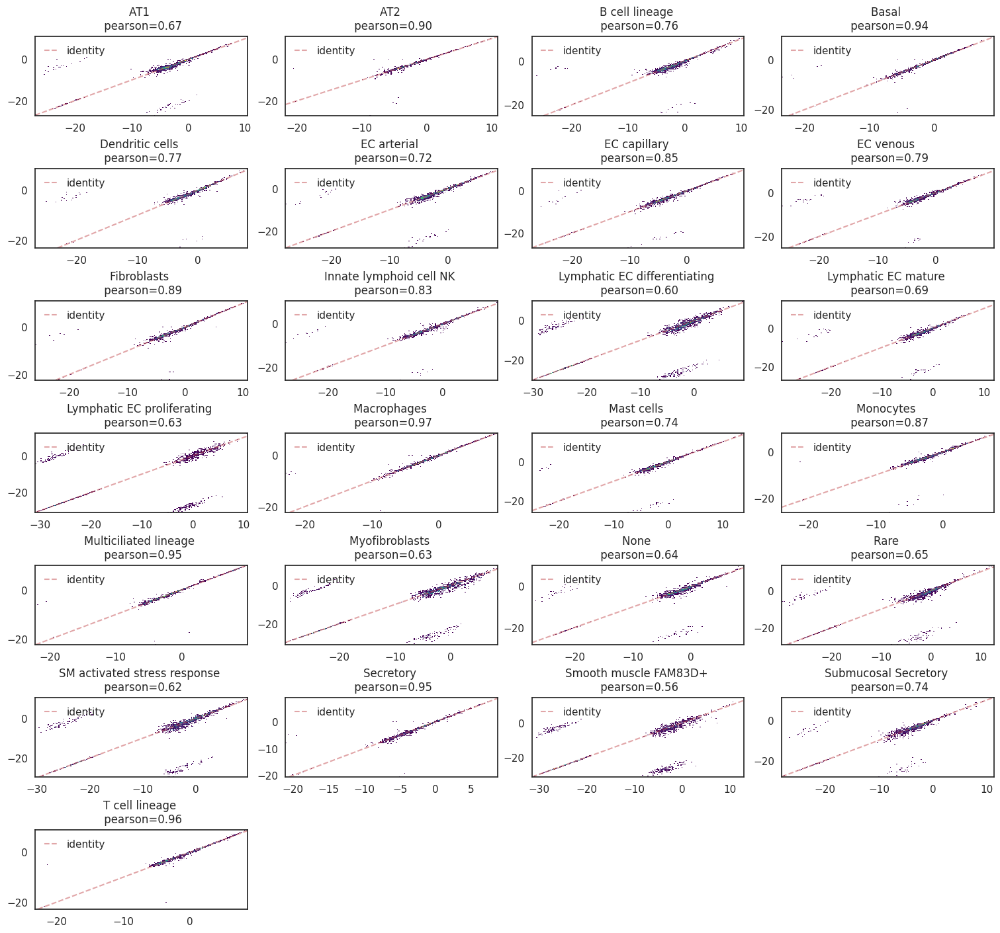

In [38]:
ppc_plt = PPCPlot(ppc)
ppc_plt.plot_diff_exp(
    "SCANVI",
    plot_kind="lfc_scatterplots",
)
fig_path = f'{temp_fig_dir}/de_per_group_lfc_scatter.svg'
plt.savefig(fig_path, dpi=300, bbox_inches="tight")
plt.show()

### Let's plot the LFC dotplots.

Plot for the raw counts

In [69]:
adata_de = anndata.AnnData(X=ppc.raw_counts.to_scipy_sparse().tocsr().copy(), obs=ppc.adata.obs, var=ppc.adata.var)
sc.pp.normalize_total(adata_de, target_sum=1e4)
sc.pp.log1p(adata_de)
with warnings.catch_warnings():
    warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
    sc.tl.rank_genes_groups(adata_de, "ann_level_3", use_raw=False, method="t-test")

In [76]:
import matplotlib

In [ ]:
with plt.rc_context({'font.size': 16}):
    fig_name = "raw.svg"
    sc.pl.rank_genes_groups_dotplot(
        adata_de,
        values_to_plot="logfoldchanges",
        vmax=7,
        vmin=-7,
        cmap="bwr",
        dendrogram=True,
        gene_symbols="feature_name",
        n_genes=2,
        save=fig_name,
    )

# move the figs to another directory
scanpy_fig_path = Path(f"figures/dotplot_{fig_name}").resolve()
scanpy_fig_path.replace(os.path.join(temp_fig_dir, fig_name))

Plot for the sampled counts.

In [81]:
# X will be overwritten
adata_approx = anndata.AnnData(X=adata_de.X, obs=adata_de.obs, var=adata_de.var)
model = "SCANVI"
one_sample = ppc.samples_dataset[model].isel(samples=0)
# overwrite X with the posterior predictive sample
one_sample_data = (
    one_sample.data.to_scipy_sparse().tocsr()
    if isinstance(one_sample.data, SparseArray)
    else one_sample
)
adata_approx.X = one_sample_data.copy()
sc.pp.normalize_total(adata_approx, target_sum=1e4)
sc.pp.log1p(adata_approx)

# run DE with the imputed normalized data
with warnings.catch_warnings():
    warnings.simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
    sc.tl.rank_genes_groups(adata_approx, "ann_level_3", use_raw=False, method="t-test")

We need to get the N highly scored genes from the DE result on the raw data. This is needed so that we can plot the same genes for the sampled data.

In [82]:
def _get_top_n_genes_per_group(adata: anndata.AnnData, n_genes: int, var_gene_names_col: Optional[str] = None):
    rgg = adata.uns["rank_genes_groups"]
    rgg_names = pd.DataFrame.from_records(rgg["names"])
    group_to_genes = {}
    for group in rgg_names.columns:
        top_n_gene_ids = rgg_names[group].values[:n_genes]
        if var_gene_names_col is None:
            top_n_gene_names = top_n_gene_ids.tolist()
        else:
            top_n_gene_names = adata.var.loc[top_n_gene_ids][var_gene_names_col].values.tolist()
        group_to_genes[group] = top_n_gene_names
    return group_to_genes

var_names = _get_top_n_genes_per_group(adata_de, 2, "feature_name")

In [83]:
var_names

{'AT1': ['AGER', 'EMP2'],
 'AT2': ['SFTPB', 'SFTPC'],
 'B cell lineage': ['CD79A', 'IGKC'],
 'Basal': ['S100A2', 'KRT19'],
 'Dendritic cells': ['HLA-DRA', 'HLA-DPB1'],
 'EC arterial': ['IFITM3', 'CLDN5'],
 'EC capillary': ['CLDN5', 'IFI27'],
 'EC venous': ['IGFBP7', 'SPARCL1'],
 'Fibroblasts': ['DCN', 'SPARCL1'],
 'Innate lymphoid cell NK': ['NKG7', 'GNLY'],
 'Lymphatic EC differentiating': ['IGFBP7', 'PPFIBP1'],
 'Lymphatic EC mature': ['CCL21', 'IGFBP7'],
 'Lymphatic EC proliferating': ['GNG11', 'STMN1'],
 'Macrophages': ['TYROBP', 'FCER1G'],
 'Mast cells': ['TPSAB1', 'TPSB2'],
 'Monocytes': ['TYROBP', 'SRGN'],
 'Multiciliated lineage': ['C20orf85', 'CAPS'],
 'Myofibroblasts': ['DCN', 'CALD1'],
 'None': ['TPM2', 'TAGLN'],
 'Rare': ['KRT18', 'KRT8'],
 'SM activated stress response': ['TAGLN', 'TPM2'],
 'Secretory': ['WFDC2', 'SLPI'],
 'Smooth muscle FAM83D+': ['ACTA2', 'TAGLN'],
 'Submucosal Secretory': ['SLPI', 'AZGP1'],
 'T cell lineage': ['IL32', 'CD3D']}

In [86]:
adata_approx.uns['dendrogram_ann_level_3'] = adata_de.uns['dendrogram_ann_level_3']

In [ ]:
fig_name = "approx.svg"
with plt.rc_context({'font.size': 16}):
    sc.pl.rank_genes_groups_dotplot(
        adata_approx,
        values_to_plot="logfoldchanges",
        vmax=7,
        vmin=-7,
        cmap="bwr",
        dendrogram=True,
        gene_symbols="feature_name",
        var_names=var_names,
        save=fig_name,
    )

# move the figs to another directory
scanpy_fig_path = Path(f"figures/dotplot_{fig_name}").resolve()
scanpy_fig_path.replace(os.path.join(temp_fig_dir, fig_name))

For better visualization let's plot smaller LFC dotplots, subsetted to immune cell types.

In [ ]:
immune_types = [
    "B cell lineage",
    "Dendritic cells",
    "Macrophages",
    "Mast cells",
    "Monocytes",
    # "Neutrophilic",
    "T cell lineage"
]
var_names_subset = {k: v for k, v in var_names.items() if k in immune_types}

with plt.rc_context({'font.size': 16}):
    # raw
    fig_name = "raw_subset.svg"
    sc.pl.rank_genes_groups_dotplot(
        adata_de,
        values_to_plot="logfoldchanges",
        vmax=7,
        vmin=-7,
        cmap="bwr",
        dendrogram=True,
        gene_symbols="feature_name",
        var_names=var_names_subset,
        save=fig_name + 'small.svg',
    )

    # sampled
    fig_name = "approx_subset.svg"
    sc.pl.rank_genes_groups_dotplot(
        adata_approx,
        values_to_plot="logfoldchanges",
        vmax=7,
        vmin=-7,
        cmap="bwr",
        dendrogram=True,
        gene_symbols="feature_name",
        var_names=var_names_subset,
        save=fig_name + 'small.svg',
    )

## 5️⃣ TREGs

In [9]:
sc.set_figure_params(vector_friendly=True, dpi_save=300, fontsize=14)

In [11]:
# run ppc+DE
models_dict = {"SCANVI": model}
ppc = PPC(model.adata, models_dict, n_samples=4)

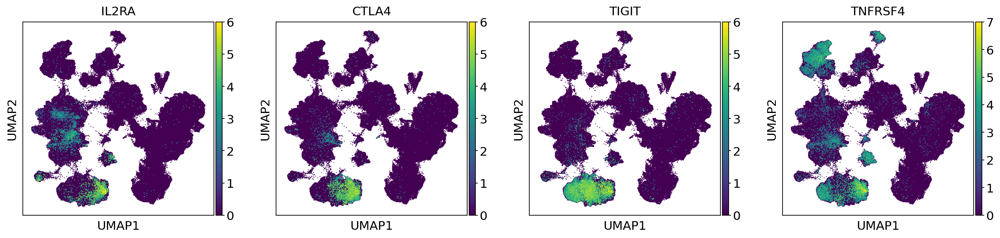

In [12]:
adata_de = anndata.AnnData(X=ppc.raw_counts.to_scipy_sparse().tocsr().copy(), obs=ppc.adata.obs, var=ppc.adata.var, obsm=ppc.adata.obsm)
sc.pp.normalize_total(adata_de, target_sum=1e4)
sc.pp.log1p(adata_de)

genes_sub = ["IL2RA", "CTLA4", "TIGIT", "TNFRSF4"]
obs_names = [i+'_imputed' for i in genes_sub]
sc.pl.umap(
    adata_de,
    color=genes_sub,
    gene_symbols='feature_name',
    size=4,
    use_raw=False,
    save="_raw_expression_treg.svg",
    vmax=[6, 6, 6, 7], vmin=0,
)

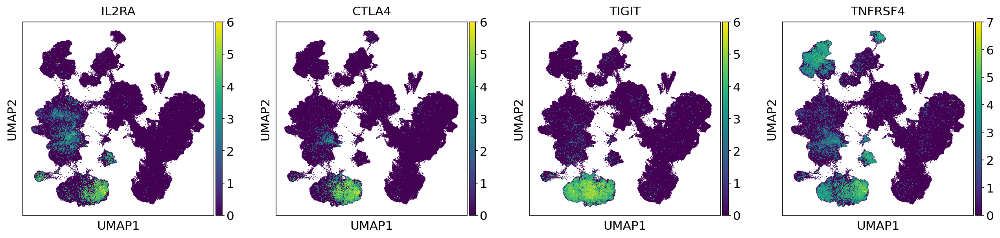

In [13]:
# X will be overwritten
adata_approx = anndata.AnnData(X=adata_de.X, obs=adata_de.obs, var=adata_de.var, obsm=ppc.adata.obsm)
model = "SCANVI"
one_sample = ppc.samples_dataset[model].isel(samples=0)
# overwrite X with the posterior predictive sample
one_sample_data = (
    one_sample.data.to_scipy_sparse().tocsr()
    if isinstance(one_sample.data, SparseArray)
    else one_sample
)
adata_approx.X = one_sample_data.copy()
sc.pp.normalize_total(adata_approx, target_sum=1e4)
sc.pp.log1p(adata_approx)

sc.pl.umap(
    adata_approx,
    color=genes_sub,
    gene_symbols='feature_name',
    size=4,
    use_raw=False,
    save="_single_expression_treg.svg",
    vmax=[6, 6, 6, 7], vmin=0,
)

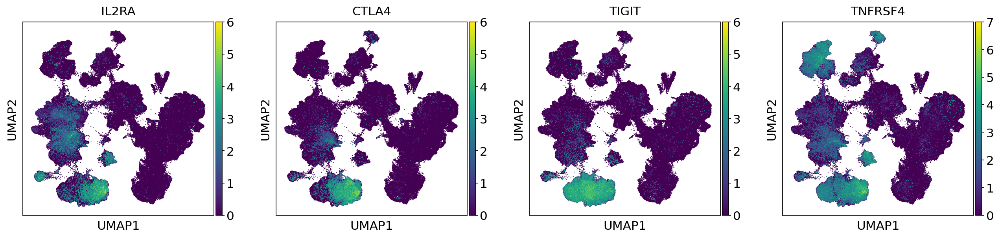

: 

In [14]:
# X will be overwritten
adata_approx = anndata.AnnData(X=adata_de.X, obs=adata_de.obs, var=adata_de.var, obsm=ppc.adata.obsm)
model = "SCANVI"
one_sample = ppc.samples_dataset[model].mean(dim="samples")
# overwrite X with the posterior predictive sample
one_sample_data = (
    one_sample.data.to_scipy_sparse().tocsr()
    if isinstance(one_sample.data, SparseArray)
    else one_sample
)
adata_approx.X = one_sample_data.copy()
sc.pp.normalize_total(adata_approx, target_sum=1e4)
sc.pp.log1p(adata_approx)

sc.pl.umap(
    adata_approx,
    color=genes_sub,
    gene_symbols='feature_name',
    size=4,
    use_raw=False,
    save="_mean_expression_treg.svg",
    vmax=[6, 6, 6, 7], vmin=0,
)

In [45]:
temp_fig_dir = "/home/cane/Documents/yoseflab/can/scvi-hub/figures/"

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


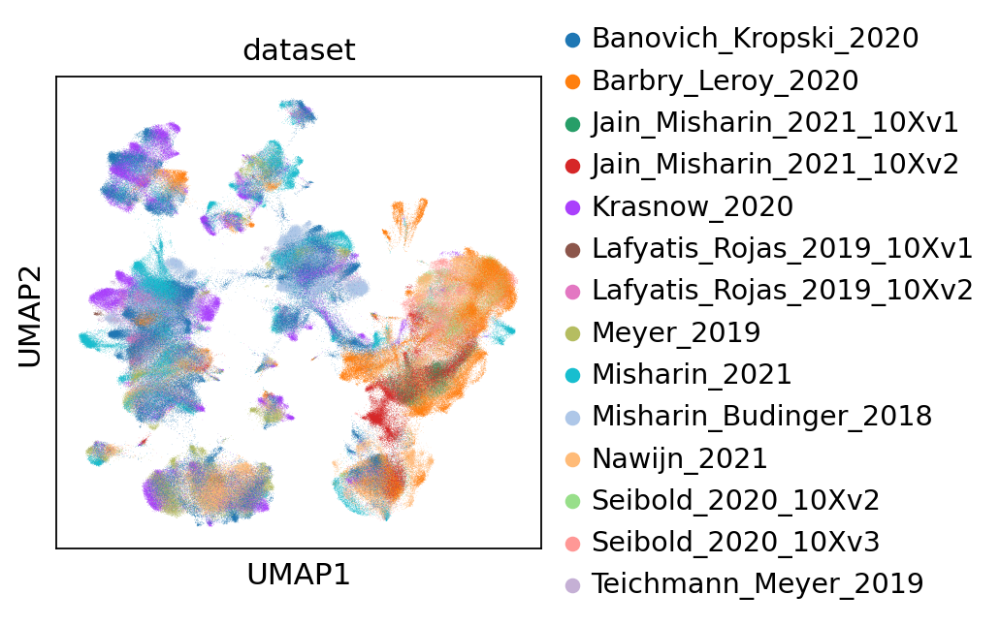

In [46]:
sc.set_figure_params(vector_friendly=True, dpi_save=300, fontsize=14)
# figsize: Optional[int] = None,
# color_map: Optional[str] = None,
sc.pl.umap(
    adata,
    color=["dataset"], # dataset is the batch key
    save="_dataset.svg",
    # legend_fontsize = 10,
)

In [47]:
np.intersect1d(adata.var['feature_name'], ['CD3E', 'IKZF2', 'CD4', 'CD3D', 'CD3G'])

array(['CD3D', 'CD3E', 'CD3G'], dtype=object)

In [48]:
genes = ["IL2RA", "CTLA4", "TIGIT", "TNFRSF4",]
subset_df = adata.var.loc[adata.var['feature_name'].isin(genes)]
genes_index = subset_df.index.tolist()
obs_names = [i+'_imputed' for i in subset_df['feature_name']]

In [49]:
adata.var_names = adata.var['feature_name'].astype(str)

In [53]:
genes_index

['ENSG00000134460', 'ENSG00000163599', 'ENSG00000181847', 'ENSG00000186827']

In [54]:
model.get_normalized_expression(
    gene_list=genes,
    n_samples=50,
    weights='uniform',
    library_size=1e4,
    transform_batch='Nawijn_2021',
    return_mean=True
)

feature_name,IL2RA,CTLA4,TIGIT,TNFRSF4
GCGACCATCCCTAACC_SC22,0.178108,0.019642,0.024886,0.116947
P2_1_GCGCAACCAGTTAACC,0.108395,0.258917,7.369168,0.684945
GCTCTGTAGTGCTGCC_SC27,0.011063,0.011905,0.023127,0.053756
P2_8_TTAGGACGTTCAGGCC,0.406677,0.028904,0.038919,0.416771
CTTGATTGTCAGTTTG_T164,0.001183,0.000745,0.008589,0.008774
...,...,...,...,...
ACCTTTACATTAACCG_T120,0.060726,0.020188,0.035092,0.098493
CATTATCTCCATGAAC_F01639,0.237573,0.277557,0.030557,0.422142
AGGCCGTGTGTGACCC-SC56,0.014996,0.004728,0.012312,0.026663
CGATGGCAGCAGGCTA-1-2,0.008656,0.002689,0.018305,0.030440


In [66]:
adata.obs[obs_names] = model.get_normalized_expression(
    gene_list=genes,
    n_samples=1,
    weights='uniform',
    library_size=1e4,
    transform_batch='Nawijn_2021',
    return_mean=True
)

In [71]:
adata.obs[obs_names]

,IL2RA_imputed,CTLA4_imputed,TIGIT_imputed,TNFRSF4_imputed
GCGACCATCCCTAACC_SC22,0.058464,0.024945,0.034209,0.127138
P2_1_GCGCAACCAGTTAACC,0.071963,0.204397,1.766056,0.319629
GCTCTGTAGTGCTGCC_SC27,0.005380,0.009123,0.010487,0.052911
P2_8_TTAGGACGTTCAGGCC,0.368501,0.114706,0.194336,1.103597
CTTGATTGTCAGTTTG_T164,0.007658,0.001648,0.020357,0.010328
...,...,...,...,...
ACCTTTACATTAACCG_T120,0.265916,0.084756,0.119427,0.205330
CATTATCTCCATGAAC_F01639,0.514348,0.189275,0.090068,0.390406
AGGCCGTGTGTGACCC-SC56,0.010304,0.023995,0.025941,0.029146
CGATGGCAGCAGGCTA-1-2,0.019835,0.030182,0.140704,0.071057


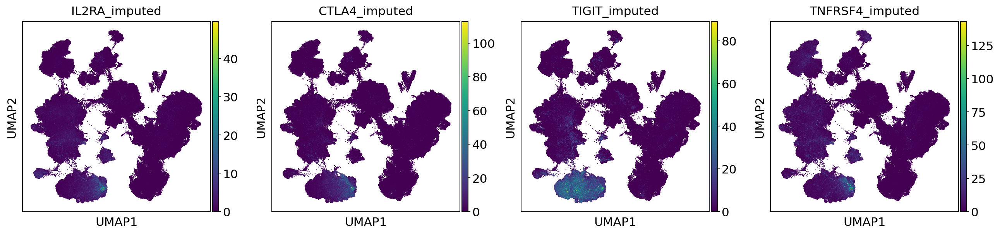

In [67]:
genes_sub = ["IL2RA", "CTLA4", "TIGIT", "TNFRSF4"]
obs_names = [i+'_imputed' for i in genes_sub]
sc.pl.umap(
    adata,
    color=obs_names,
    gene_symbols='feature_name',
    size=4,
    use_raw=False,
    save="_imputed_expression_treg.svg",
    vmin=0,
)

In [68]:
adata.obs[obs_names] = np.log1p(adata.obs[obs_names])

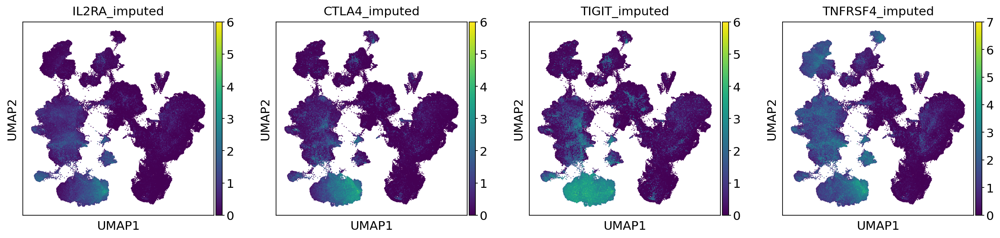

In [69]:
genes_sub = ["IL2RA", "CTLA4", "TIGIT", "TNFRSF4"]
obs_names = [i+'_imputed' for i in genes_sub]
sc.pl.umap(
    adata,
    color=obs_names,
    gene_symbols='feature_name',
    size=4,
    use_raw=False,
    save="_imputed_expression_treg.svg",
    vmax=[6, 6, 6, 7], vmin=0,
)

In [60]:
sc.pp.normalize_total(adata, target_sum=1e4)

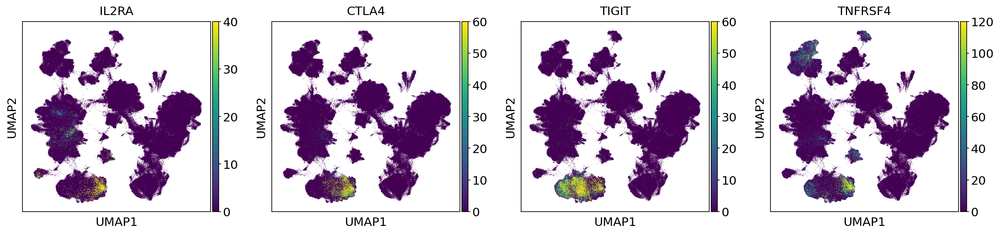

In [63]:
genes_sub = ["IL2RA", "CTLA4", "TIGIT", "TNFRSF4"]
obs_names = [i+'_imputed' for i in genes_sub]
sc.pl.umap(
    adata,
    color=genes_sub,
    size=1,
    use_raw=False,
    save="_raw_expression_treg.svg",
    vmax=[40, 60, 60, 120]
)

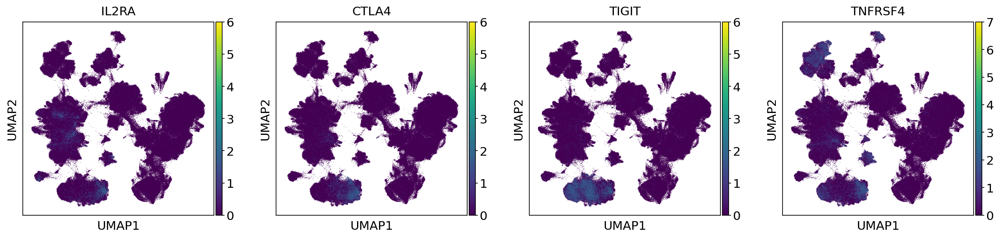

In [65]:
sc.pp.log1p(adata)
sc.pl.umap(
    adata,
    color=genes_sub,
    size=1,
    use_raw=False,
    save="_raw_expression_treg.svg",
    vmax=[6, 6, 6, 7], vmin=0,
)

In [19]:
adata_url = "https://cellxgene.cziscience.com/e/066943a2-fdac-4b29-b348-40cede398e4e.cxg/"
adata.raw = cellxgene(adata_url, filename="hlca_core.h5ad", save_path=local_dir)

In [20]:
adata.raw.var.index = adata.raw.var['feature_name']

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


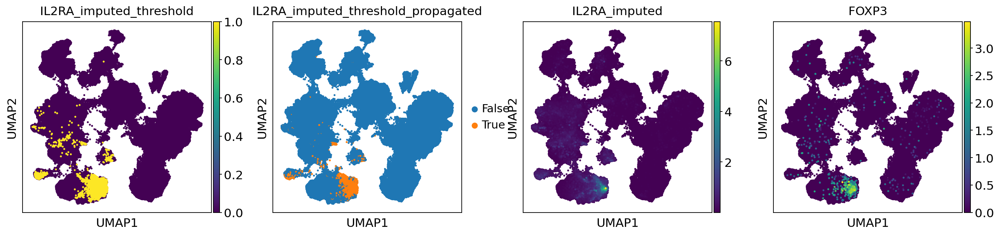

In [22]:
adata.obs["IL2RA_imputed_threshold"] = [int(i) for i in adata.obs["IL2RA_imputed"] > 0.5]
adata.obs["IL2RA_imputed_threshold_propagated"] = ((adata.obsp['connectivities'] > 0) * adata.obs["IL2RA_imputed_threshold"]) > 1.0
adata.obs["IL2RA_imputed_threshold_propagated"] = adata.obs["IL2RA_imputed_threshold_propagated"].astype("category")

sc.pl.umap(
    adata,
    color=["IL2RA_imputed_threshold", "IL2RA_imputed_threshold_propagated", "IL2RA_imputed", "FOXP3"],
    size=20,
    use_raw=True,
    save="_foxp3_thresholding.svg",
    sort_order=True
)

In [23]:
adata_sub = adata[np.logical_and(adata.obs["IL2RA_imputed_threshold"] == True, adata.obs['cell_type'] == 'CD4-positive, alpha-beta T cell')]
adata_sub.obs['cell_type'].value_counts()

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


CD4-positive, alpha-beta T cell    6985
Name: cell_type, dtype: int64

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


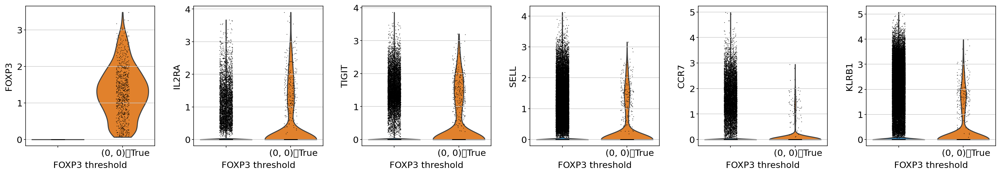

In [24]:
adata.obs['FOXP3_threshold'] = [str(i) for i in adata.raw[:, 'FOXP3'].X > 0]
sc.pl.violin(adata, groupby='FOXP3_threshold', keys=['FOXP3', 'IL2RA', 'TIGIT', 'SELL', 'CCR7', 'KLRB1'], gene_symbols='feature_name')

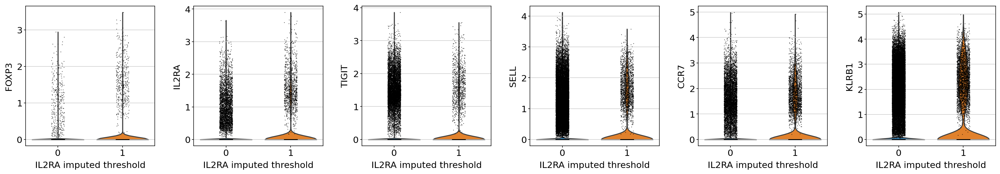

In [25]:
adata.obs["IL2RA_imputed_threshold"] = adata.obs["IL2RA_imputed_threshold"].astype("category")
sc.pl.violin(adata, groupby='IL2RA_imputed_threshold', keys=['FOXP3', 'IL2RA', 'TIGIT', 'SELL', 'CCR7', 'KLRB1'], gene_symbols='feature_name')

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


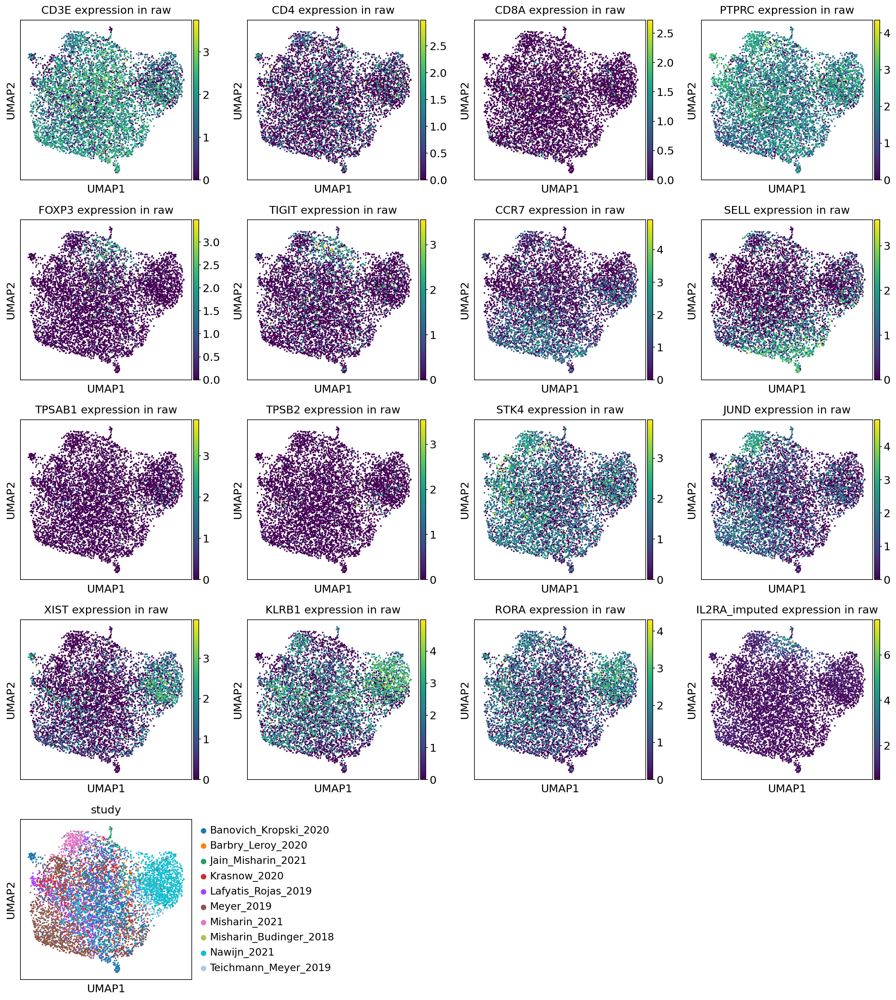

In [31]:
genes = ['CD3E', 'CD4', 'CD8A', 'PTPRC', 'FOXP3', 'TIGIT', 'CCR7', 'SELL', 'TPSAB1', 'TPSB2', 'STK4', 'JUND', 'XIST', 'KLRB1', 'RORA', 'IL2RA_imputed']
title_list = [f'{i} expression in raw' for i in genes]
sc.pp.neighbors(adata_sub, use_rep='X_scanvi_emb')
sc.tl.umap(adata_sub, min_dist=0.3)
sc.pl.umap(
    adata_sub,
    color=genes + ['study'],
    use_raw=True,
    title=title_list,
    save="_treg_heterogeneity.svg",
)

In [37]:
adata_sub2 = adata[adata.raw[:, "FOXP3"].X > 0.]

/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/home/cane/miniconda3/envs/resolvi/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


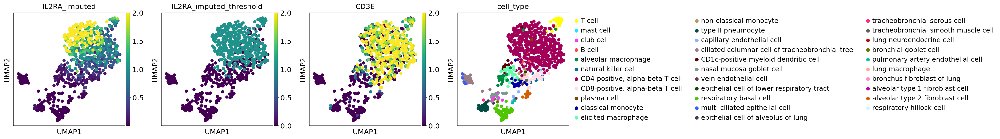

In [42]:
adata_sub2.obs["IL2RA_imputed_threshold"] = [int(i) for i in adata_sub2.obs["IL2RA_imputed"] > 0.5]
sc.pp.neighbors(adata_sub2, use_rep='X_scanvi_emb')
sc.tl.umap(adata_sub2)
sc.pl.umap(
    adata_sub2,
    color=['IL2RA_imputed', 'IL2RA_imputed_threshold', 'CD3E', 'cell_type'],
    use_raw=True,
    sort_order=True,
    vmax=2,
    ncols=5,
    save="_foxp3_positive_heterogeneity.svg",
)

## Gene signature UMAP's

In [8]:
# get HLCA embeddings
fname = "HLCA_full_v1.1_emb.h5ad"
adata_emb = sc.read(os.path.join(local_dir, fname), backup_url=f"https://zenodo.org/record/7599104/files/{fname}")
adata_emb = adata_emb[adata_emb.obs["core_or_extension"] == "core"].copy()
qzm = adata_emb[model.adata.obs.index].copy().X

In [9]:
# minify model
_, qzv = model.get_latent_representation(give_mean=False, return_dist=True)
latent_qzm_key = "SCANVI_latent_qzm"
latent_qzv_key = "SCANVI_latent_qzv"
model.adata.obsm[latent_qzm_key] = qzm
model.adata.obsm[latent_qzv_key] = qzv
model.minify_adata(
    use_latent_qzm_key=latent_qzm_key, use_latent_qzv_key=latent_qzv_key
)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/Users/valehvpa/GitRepos/scvi-tools/scvi/model/utils/_minification.py:30: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  bdata = AnnData(


INFO     Generating sequential column names                                                                        
INFO     Generating sequential column names                                                                        


/Users/valehvpa/GitRepos/scvi-tools/scvi/data/fields/_dataframe_field.py:227: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/Users/valehvpa/GitRepos/scvi-tools/scvi/data/fields/_scanvi.py:58: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  mapping = _make_column_categorical(


In [10]:
model

ScanVI Model with the following params: 
unlabeled_category: unlabeled, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: True

In [16]:
pps = model.posterior_predictive_sample(
    model.adata,
    n_samples=1,
    batch_size=32,
)

In [25]:
model.adata.X = pps.to_scipy_sparse()

In [ ]:
# # add granzyme a and b expressions and subtract ccr7 and sell expressions -- this will act as a proxy to detect CD8 memory vs naive in terms of expression
# var_idx_1 = model.adata.var.feature_name.isin(["GZMB", "GZMA"])
# var_idx_2 = model.adata.var.feature_name.isin(["CCR7", "SELL"])
# sig = model.adata[:, var_idx_1].X.sum(1) - model.adata[:, var_idx_2].X.sum(1)
# model.adata.obs["CD8_memory_vs_naive"] = sig.toarray()

In [26]:
# B cells: CD79A, MZB1, MS4A1, JCHAIN
# T cells: CD3D, CD3E, CD2, CD5, LEF1, NKG7

var_idx_t = model.adata.var.feature_name.isin(["CD3D"])
model.adata.obs["t_cells"] = np.log1p(model.adata[:, var_idx_t].X.sum(1))

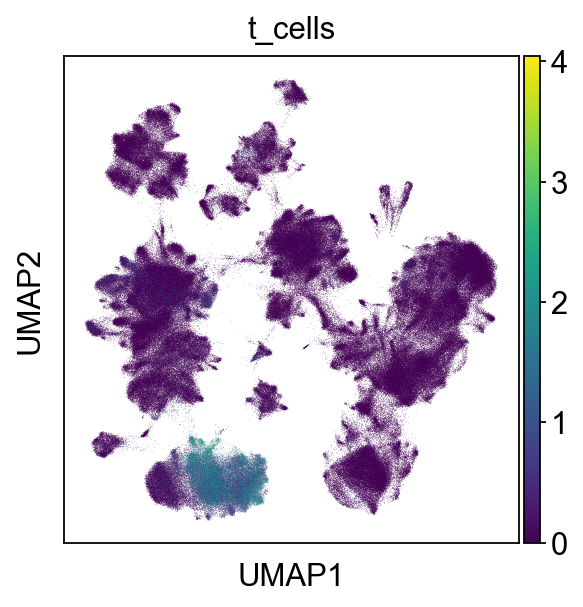

PosixPath('/Users/valehvpa/GitRepos/scvi-hub-reproducibility/local/temp_figs/umap_markers.svg')

In [27]:
sc.set_figure_params(vector_friendly=True, dpi_save=300, fontsize=14)
sc.pl.umap(
    model.adata,
    color=["t_cells"],
    save="_markers.svg",
)

# move the fig to another directory
temp_fig_dir = "/Users/valehvpa/GitRepos/scvi-hub-reproducibility/local/temp_figs"
scanpy_fig_path = Path("figures/umap_markers.svg").resolve()
scanpy_fig_path.replace(os.path.join(temp_fig_dir, "umap_markers.svg"))